#### Import libraries

In [1]:
import sys
sys.path.append("/kaggle/input/yolov7-lib/yolov7-main")

import cv2
import numpy as np
import torch
from PIL import Image, ImageDraw, ImageFont

from models.experimental import attempt_load
from utils.general import non_max_suppression

WEIGHTS = "/kaggle/input/yolov7-weights/yolov7.pt"
DEVICE = "cpu"
IMAGE_SIZE = 640

CLASSES = [
    "person", "bicycle", "car", "motorcycle", "airplane", "bus", "train", "truck", "boat", "traffic light", 
    "fire hydrant", "stop sign", "parking meter", "bench", "bird", "cat", "dog", "horse", "sheep", "cow", 
    "elephant", "bear", "zebra", "giraffe", "backpack", "umbrella", "handbag", "tie", "suitcase", "frisbee", 
    "skis", "snowboard", "sports ball", "kite", "baseball bat", "baseball glove", "skateboard", "surfboard", 
    "tennis racket", "bottle", "wine glass", "cup", "fork", "knife", "spoon", "bowl", "banana", "apple", 
    "sandwich", "orange", "broccoli", "car|rot", "hot dog", "pizza", "donut", "cake", "chair", "couch", 
    "potted plant", "bed", "dining table", "toilet", "tv", "laptop", "mouse", "remote", "keyboard", 
    "cell phone", "microwave", "oven", "toaster", "sink", "refrigerator", "book", "clock", "vase", "scissors", 
    "teddy bear", "hair drier", "toothbrush"]

#### Load YOLOv7

In [2]:
model = attempt_load(WEIGHTS, map_location=DEVICE)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block


#### Helper

This function can be reused for object detection
It takes an image and returns keypoints as numpy array of shape ```[num_objects, 6]```.
Each object is represented as ```[x1, y1, x2, y2, conf, class_id]```.

In [3]:
def predict(image, image_size=640):
    image = np.asarray(image)
    
    # Resize image to the inference size
    ori_h, ori_w = image.shape[:2]
    image = cv2.resize(image, (image_size, image_size))
    
    # Transform image from numpy to torch format
    image_pt = torch.from_numpy(image).permute(2, 0, 1).to(DEVICE)
    image_pt = image_pt.float() / 255.0
    
    # Infer
    with torch.no_grad():
        pred = model(image_pt[None], augment=False)[0]
    
    # NMS
    pred = non_max_suppression(pred)[0].cpu().numpy()
    
    # Resize boxes to the original image size
    pred[:, [0, 2]] *= ori_w / image_size
    pred[:, [1, 3]] *= ori_h / image_size
    
    return pred

#### Load image

/opt/conda/lib/python3.7/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


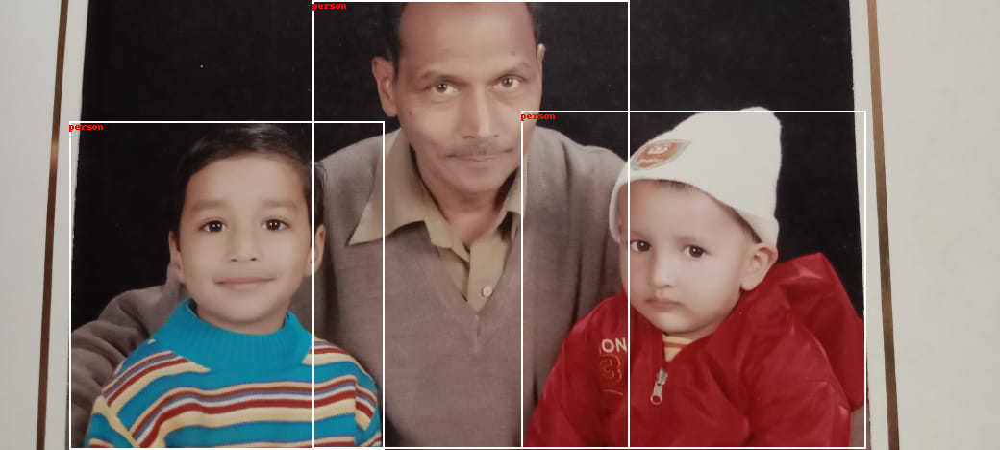

In [4]:
IMAGE_FILE = "../input/family001/4cde74db-11e3-4cf6-adae-cf1c3b47df9d.jpg"
image = Image.open(IMAGE_FILE)
pred = predict(image)
draw = ImageDraw.Draw(image)
for x1, y1, x2, y2, conf, class_id in pred:
    draw.rectangle(((x1, y1), (x2, y2)), width=2)
    draw.text((x1, y1), CLASSES[int(class_id)],fill='red')
image   

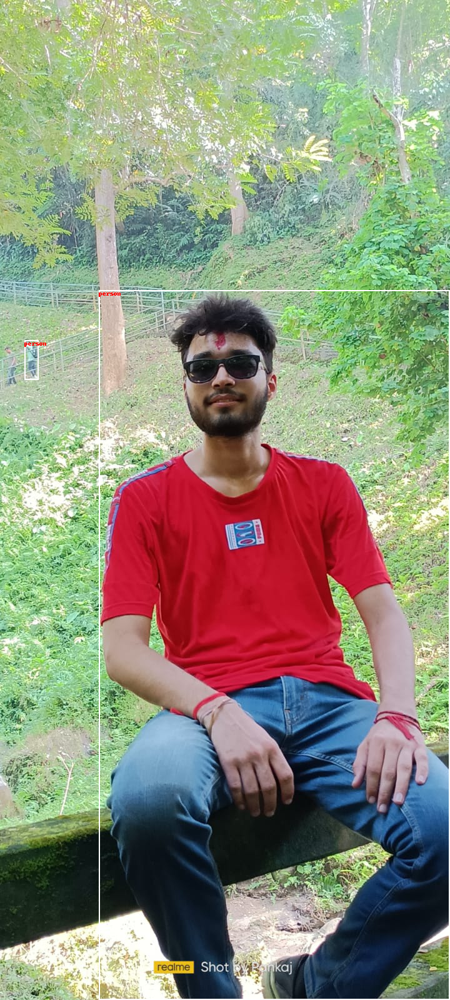

In [5]:
IMAGE_FILE = "../input/family003/0d304e2d-9436-40e6-9263-4bd4c363e07a.jpg"
image = Image.open(IMAGE_FILE)
pred = predict(image)
draw = ImageDraw.Draw(image)
for x1, y1, x2, y2, conf, class_id in pred:
    draw.rectangle(((x1, y1), (x2, y2)), width=2)
    draw.text((x1, y1), CLASSES[int(class_id)],fill='red')
image    

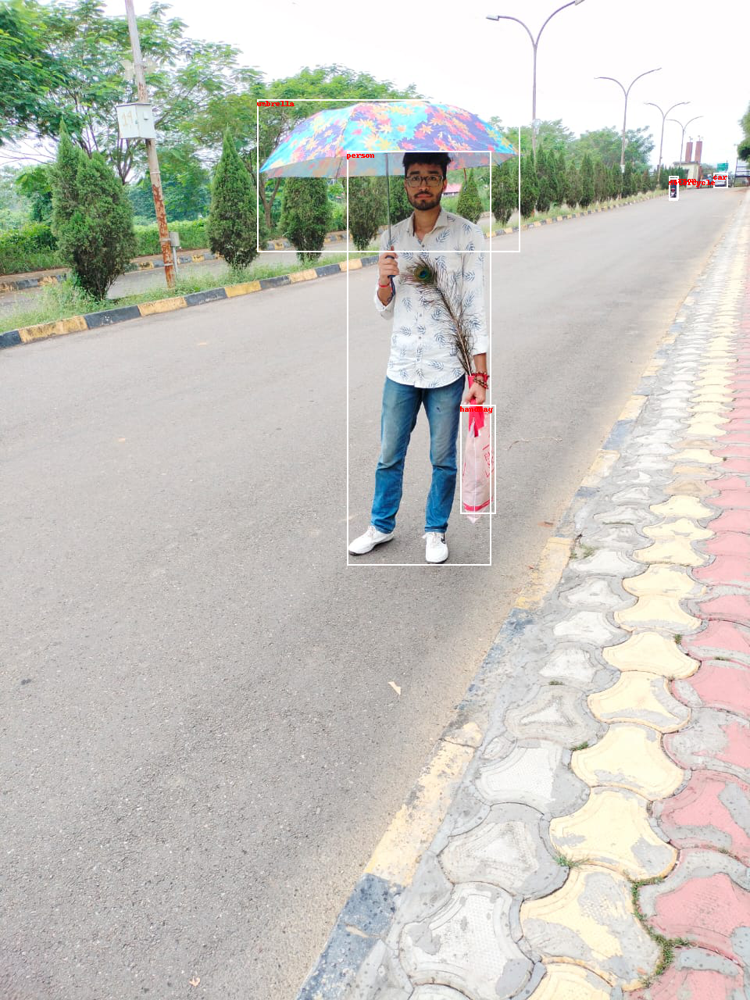

In [6]:
IMAGE_FILE = "../input/family003/9cffa1e7-0117-4f5e-8e53-362970553441.jpg"
image = Image.open(IMAGE_FILE)
pred = predict(image)
draw = ImageDraw.Draw(image)
for x1, y1, x2, y2, conf, class_id in pred:
    draw.rectangle(((x1, y1), (x2, y2)), width=2)
    draw.text((x1, y1), CLASSES[int(class_id)],fill='red')
image    

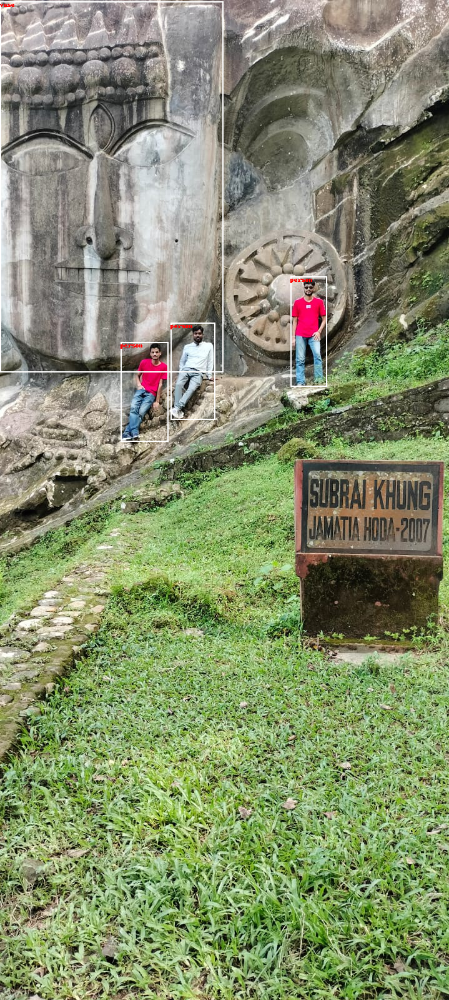

In [7]:
IMAGE_FILE = "../input/pic001/8bd31b20-37da-4e50-ab8b-0f609b9b9950.jpg"
image = Image.open(IMAGE_FILE)
pred = predict(image)
draw = ImageDraw.Draw(image)
for x1, y1, x2, y2, conf, class_id in pred:
    draw.rectangle(((x1, y1), (x2, y2)), width=2)
    draw.text((x1, y1), CLASSES[int(class_id)],fill='red')
image   

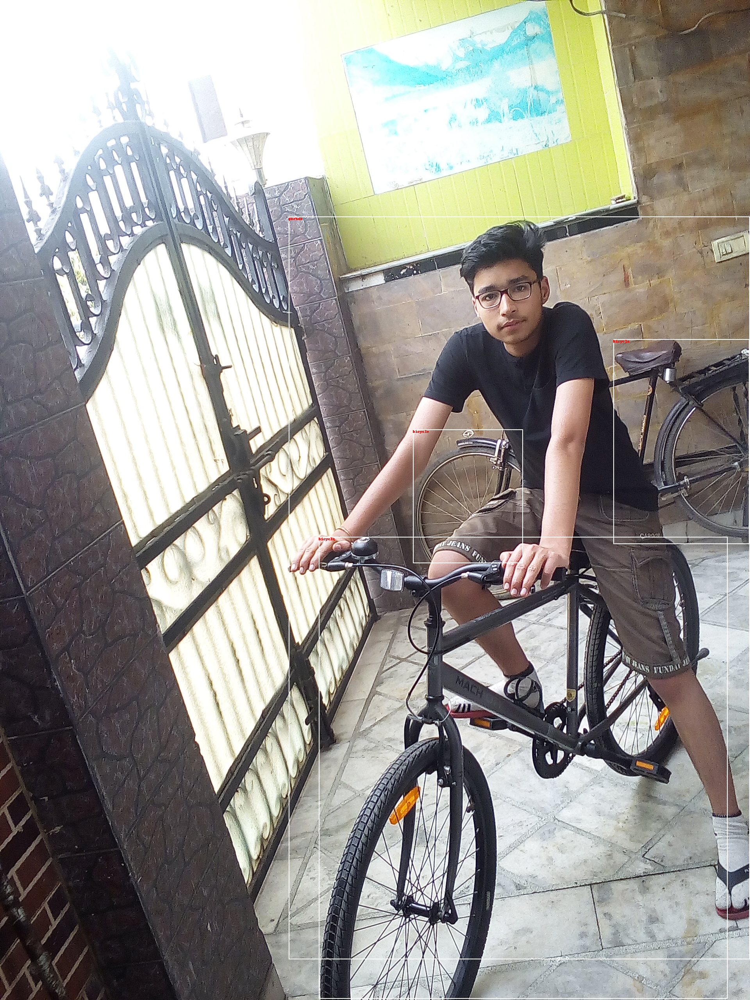

In [8]:
IMAGE_FILE = "../input/dvgarg001/IMG_20190407_154839.jpg"
image = Image.open(IMAGE_FILE)
pred = predict(image)
draw = ImageDraw.Draw(image)
for x1, y1, x2, y2, conf, class_id in pred:
    draw.rectangle(((x1, y1), (x2, y2)), width=2)
    draw.text((x1, y1), CLASSES[int(class_id)],fill='red')
image   